## MuSpAn with Xenium Explorer

In this tutorial, we will introduce some handy helper functions that have been developed to import spatial transcriptomics data generated using the Xenium platform. These functions are designed to provide a simplified workflow for importing data in tandem with the [10x Xenium Explorer software](https://www.10xgenomics.com/support/software/xenium-explorer/latest), to focus on regions for analysis. Please note that you can always alternatively add data to MuSpAn using the standard functionality for data input (`add_points`, `add_labels`, `add_shapes`, etc.) if desired - this tutorial and the functions described in it are designed to simplify common ways of interacting with the Xenium Explorer software.

To get started, we will need a Xenium dataset to import and analyse. We will be using a sample dataset of Healthy Mouse Colon tissue provided by 10x, produced using the *in situ* gene expression with cell segmentation staining data for mouse colon tissue using the Xenium mouse tissue atlassing panel, which can be found on the [10x resources site](https://www.10xgenomics.com/datasets/fresh-frozen-mouse-colon-with-xenium-multimodal-cell-segmentation-1-standard).

You will need to download the complete dataset folder to your local machine, as we will need all output files (cells.parquet,cell_boundaries.parquet, transcripts.parquet,nucleus.parquet, experiment.xenium) to unpack the spatial information to create a MuSpAn domain via the functions in this tutorial.

As there is so much information in these datasets, processing a whole slide image can be slow. For now, we will use Xenium Explorer to annotate regions of interest to analyse as shown below:

![A flow chart of exporting regions of interest from Xenium Explorer](Xen_exp_tut.png)

We selected 'Download Cell Stats as CSV' from the Selections tab in Xenium Explorer, saving it under the filename 'mouse_region_for_tutorial.csv' in a local directory. Make sure you know where it has been saved, as we will need to use this file to create a MuSpAn domain.


**Note:** The cell clusters willl be defined by the clustering method that is currently actively in Xenium Explorer as we retreive the cluster information from the region-of-interest csv file (mouse_region_for_tutorial.csv). In this example, we have the 'graph-based' cell clustering selected which will imported as labels for the cells. (If you have done your own cell clustering using a separate software tool, remember that you can always add the information using `add_labels`.)

Now We have everything we need to create a MuSpAn domain! So let's set up our usual imports

In [2]:
# Import necessary modules
import muspan as ms  # MuSpAn for spatial analysis
import numpy as np  # NumPy for numerical operations
import matplotlib.pyplot as plt  # Matplotlib for plotting

Helper functions for transferring certain types of data into MuSpAn domains are contained in the `io` submodule, and so we can import data extracted from Xenium Explorer using the function `ms.io.xenium_to_domain`. We have a few options when importing the data, regarding the format of the objects (do we want cells as points or shapes?) and the option to import nuclei segmentations. Importing transcripts needs slightly more care, as there can be *a lot* of them, many of which are unlikely to be necessary for a given analysis. If you are importing transcript data, we suggest you specify transcript names of interest to avoid going beyond the memory capabilities of your machine.

In this example, we are going to load in the cells as shapes, with their nuclei and a selection of transcripts that we may be interested in:

In [ ]:
# Define the path to the Xenium data and the selection region CSV file
path_to_my_xenium_data = 'path/to/Data/Xenium_V1_mouse_Colon_FF_outs'  # Path to the Xenium data
path_to_my_selection_region = 'path/to/Data/mouse_region_for_tutorial.csv'  # Path to the selection region CSV file

# List of transcript names of interest
transcripts_of_interest = ['Oit1', 'Cldn2', 'Nupr1', 'Sox9', 'Ccl9', 'Mylk', 'Myl9', 'Cnn1', 'Mgll', 'Mustn1']

# Import the Xenium data into a MuSpAn domain
pc = ms.io.xenium_to_domain(
    path_to_xenium_data=path_to_my_xenium_data,
    domain_name='A test domain',
    cells_from_selection_csv=path_to_my_selection_region,
    load_transcripts=True,
    selected_transcripts=transcripts_of_interest,
    load_nuclei=True,
    load_cells_as_shapes=True,
    exclude_no_nuclei_cells=True
)

Depending on the size of the ROI and number of transcripts of interest being loaded, this can take some time. For larger regions, we recommend loading in cells in as points (cell centres), without nuclei and transcripts (note the numbers of transcripts of a certain type could be stored within MuSpAn as a label associated with each cell, if you aren't interested in the specific location of transcripts within each cell). Let's check everything has been loaded in correctly:

In [9]:
# Print the MuSpAn domain object to check its contents and ensure it has been loaded correctly
print(pc)

Domain name: A test domain
Number of objects: 19693
Collections: ['Cell boundaries', 'Nucleus boundaries', 'Transcripts']
Labels: ['Cell ID', 'Transcript Counts', 'Cell Area', 'Cluster ID', 'Nucleus Area', 'Transcript', 'Transcript ID'] 
Networks: [] 
Distance matrices: []


Under the hood, MuSpAn is finding the relevant data from the files we downloaded and linking the data using the 'Cell ID' label. This label is added to all imported objects and can be helpful for querying data. In addition, the cell boundaries (or centroids if loaded as points), nuclei and transcripts are allocated as separate collections of objects which can also be used to define queries for analysis. For more information on querying, check out our querying tutorials!

Now we have our domain loaded, let's visualise the data to make sure it's what we expected to import from Xenium Explorer.

In [8]:
# Queries to isolate the different objects within the MuSpAn domain

# Query to isolate cell boundaries
qCells = ms.query.query(pc, ('Collection',), 'is', 'Cell boundaries')

# Query to isolate transcripts
qTrans = ms.query.query(pc, ('Collection',), 'is', 'Transcripts')

# Query to isolate nucleus boundaries
qNuc = ms.query.query(pc, ('Collection',), 'is', 'Nucleus boundaries')

Text(0.5, 1.0, 'Nuclei')

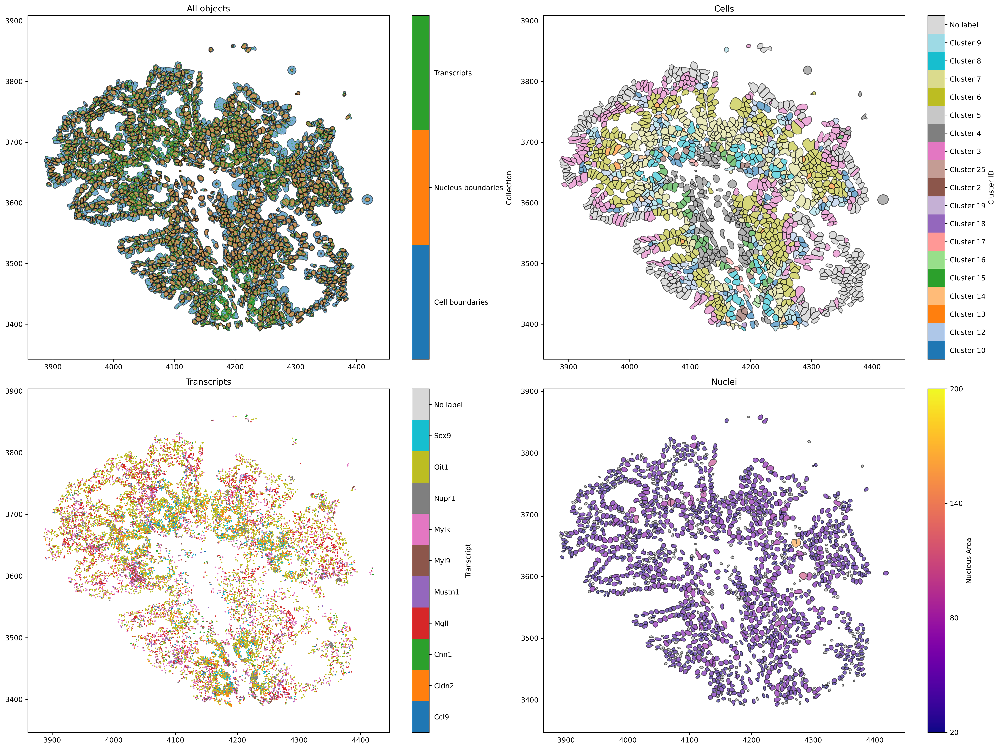

In [12]:
# Create a figure with 2x2 subplots
fig, ax = plt.subplots(figsize=(20, 15), nrows=2, ncols=2)

# Visualise all objects in the MuSpAn domain
ms.visualise.visualise(pc, ax=ax[0, 0], marker_size=0.05)
ax[0, 0].set_title('All objects')

# Visualise cells, colored by 'Cluster ID'
ms.visualise.visualise(pc, color_by=('label', 'Cluster ID'), ax=ax[0, 1], objects_to_plot=qCells)
ax[0, 1].set_title('Cells')

# Visualise transcripts, colored by 'Transcript'
ms.visualise.visualise(pc, color_by=('label', 'Transcript'), ax=ax[1, 0], objects_to_plot=qTrans, marker_size=1)
ax[1, 0].set_title('Transcripts')

# Visualise nuclei, colored by 'Nucleus Area'
ms.visualise.visualise(pc, color_by=('label', 'Nucleus Area'), ax=ax[1, 1], objects_to_plot=qNuc, vmin=20, vmax=200)
ax[1, 1].set_title('Nuclei')

As MuSpAn is built for multiscale anlysis, we automatically use the Cell ID to relate relevant objects here, and can map this inheritance as a family tree. For example, 'Cells' are parent objects of 'Transcripts'. This can be viewed using the `ms.visualise.visualise_family_tree` function.

(<Figure size 6750x1080 with 3 Axes>, <Axes: >)

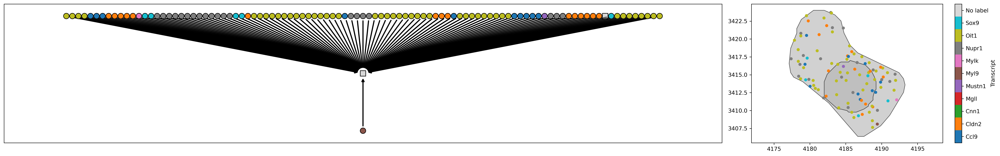

In [18]:
# Define the cell ID of interest (found using Xenium Explorer or by looking at the cell ID in the cell table)
cell_id_of_interest = 'bnbekepb-1'

# Create a query to isolate the candidate cell based on the cell ID
candiate_cell_query_1 = ms.query.query(pc, ('label', 'Cell ID'), 'is', cell_id_of_interest)

# Create a query container and add the candidate cell query to it
query_this_cell = ms.query.query_container()
query_this_cell.add_query(candiate_cell_query_1, 'AND', qCells)

# Get the family tree of the selected cell
this_family_tree = ms.query.get_family_tree(pc, query_this_cell)

# Get the family tree of the selected cell to retrieve its ancestors -  this is just to visualise the selected cell and its ancestors
this_cells_acenstors = list(this_family_tree.nodes())

# Create a figure with 1x2 subplots, with different width ratios
fig, ax = plt.subplots(figsize=(25, 4), nrows=1, ncols=2, width_ratios=[3, 1])

# Visualize the family tree of the selected cell, coloring by 'Transcript'
# We can color by any label or collection, see documentation for more details
ms.visualise.visualise_family_tree(pc, this_family_tree, ax=ax[0], color_by='Transcript ID', add_id_label=False, add_cbar=False)

# Visualize the selected cell and its ancestors, coloring by 'Transcript'
ms.visualise.visualise(pc, objects_to_plot=this_cells_acenstors, ax=ax[1], color_by=('label', 'Transcript ID'))

Now that we have the data imported from Xenium Explorer, we are ready to start analysing the data as we would any other MuSpAn domain!